# Comparing different ap_pipe runs:
# HiTS 2014: DCR and CompareWarp using PSF-matched warps

Earlier work in DM-22081 suggested that the variable PSFs being used to construct DCR models might be limiting their performance. In order to investigate this possibility I built DCR and CompareWarp coadds using PSF-matched warps with the same PSF-size selection criteria for both. Our image differencing pipeline currently struggles when the template has worse seeing than the science image, but in this case the DCR and CompareWarp coadds should be comparable.

During coaddition I noted that the DCR model reported good convergence for most of the processed patches, with typical final convergence of 100%-200% typical. This figure is unfortunately only reported in the logs (DM-19872), so I can't include a more quanatative assessment. Given the good reported convergence, I expect the PSF-matched DCR coadds to reduce the number of image differencing artifacts.

## Set up the environment and import packages

In [1]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import functools
import itertools
import importlib
import operator

import astropy
import astropy.units as u
import astropy.coordinates as coord
from astropy.visualization import make_lupton_rgb
from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize

import lsst.geom as geom
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
from lsst.ap.association import UnpackApdbFlags, MapDiaSourceConfig
from lsst.utils import getPackageDir

In [2]:
sys.path.append('/project/sullivan/ap_pipe-notebooks/')
from diaObjectAnalysis import loadAllApdbObjects, loadAllApdbSources, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve
from dcrMetric import DcrMetric

In [3]:
# Only if you change anything in the code imported above
importlib.reload(plc)

<module 'plotLightcurve' from '/home/sullivan/ap_pipe-notebooks/plotLightcurve.py'>

## Perform a few checks on the coadds used for templates

In [4]:
dcr2014_ref_repo = '/project/sullivan/jan_2020/hits2014/assemble_dcr/'
butlerDcr2014_ref = dafPersist.Butler(dcr2014_ref_repo)
dcr2014_psf_repo = '/project/sullivan/feb_2020/hits2014/assemble_dcr/'
butlerDcr2014_psf = dafPersist.Butler(dcr2014_psf_repo)

In [5]:
patch = '32,37'

In [6]:
coadd_dcr2014_ref = butlerDcr2014_ref.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})
coadd_dcr2014_psf = butlerDcr2014_psf.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})

Visually verify that the coadds are OK, and check that they have appropriate visit IDs. This check is important because an error in the setup can easily lead to the wrong coadds being loaded for the template (from the parent repository). 2014 visit IDs should start with a '2' and 2015 visit IDs should start with a '4'.

In [7]:
a = coadd_dcr2014_ref.getInfo().getCoaddInputs().ccds.asAstropy()["visit"]
b = coadd_dcr2014_psf.getInfo().getCoaddInputs().ccds.asAstropy()["visit"]

In [8]:
print(min(a),max(a), min(b), max(b))

288929 292404 288929 292404


Visually compare the DCR model built from direct warps ("ref") and the DCR model built from PSF-matched warps ("PSF")

<IPython.core.display.Javascript object>


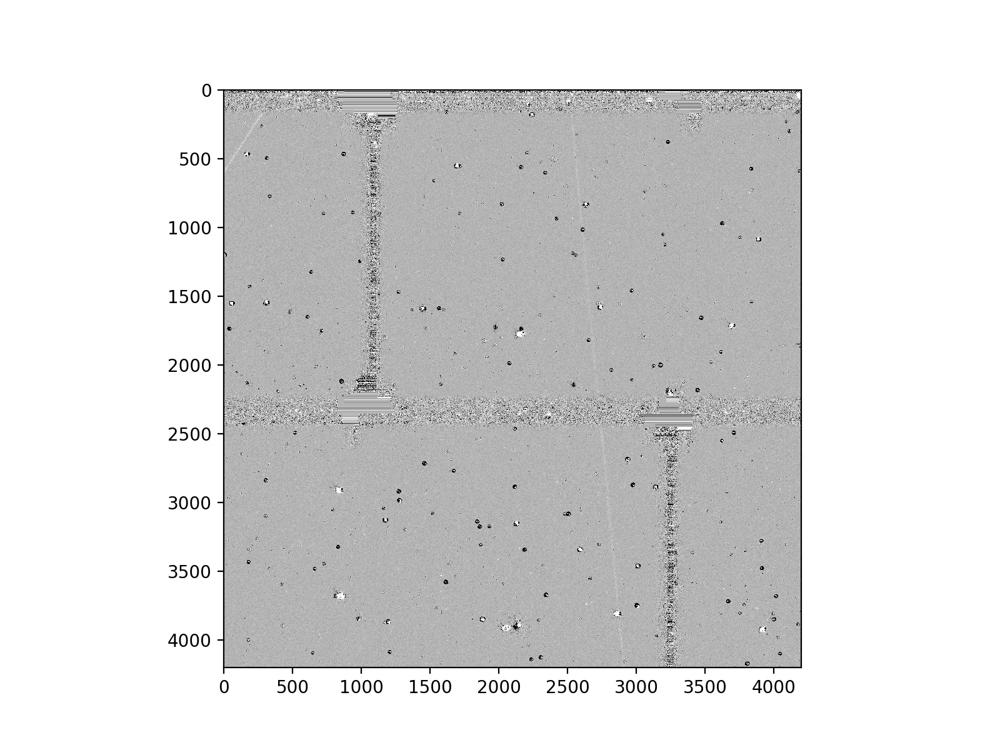

<IPython.core.display.Javascript object>


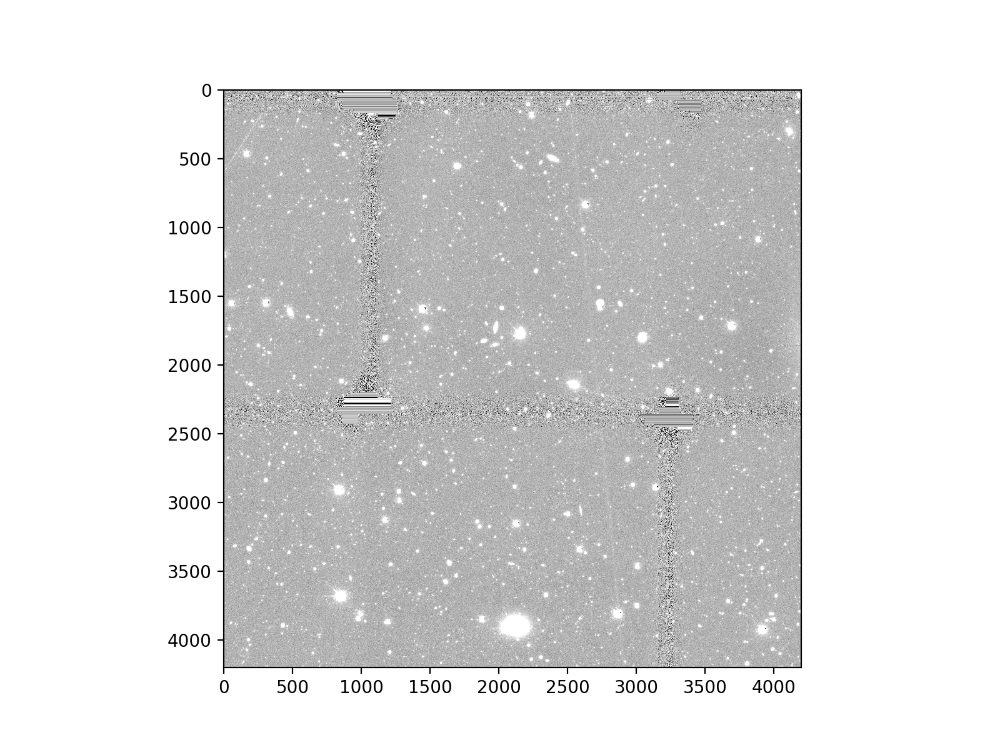

<IPython.core.display.Javascript object>


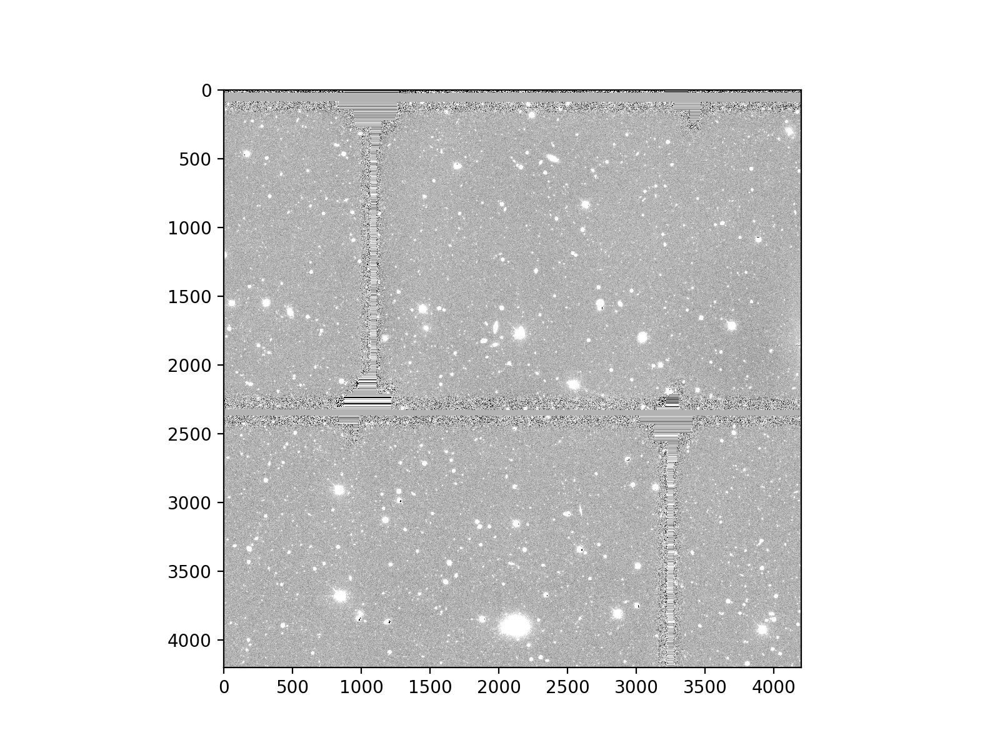

In [9]:
plt.figure(figsize=(8, 6))
# Note: multiply the DCR images by 3, because each is just the middle subfilter out of 3 and contains 1/3 the flux.
img1a = coadd_dcr2014_ref.getImage().getArray()*3
img2a = coadd_dcr2014_psf.getImage().getArray()*3
norm = ImageNormalize(img1a, interval=ZScaleInterval(), stretch=SqrtStretch())
plt.imshow(img1a - img2a, norm=norm, cmap='gray')
plt.figure(figsize=(8, 6))
plt.imshow(img1a, norm=norm, cmap='gray')
plt.figure(figsize=(8, 6))
plt.imshow(img2a, norm=norm, cmap='gray')

Looks fine, but the direct warp DCR coadd appears to contain a couple satellite trails (probably?) that were properly masked in the PSF matched DCR model (as well as the comparewarp coadd). This is a bug, see ticket DM-22825.

# Look at RGB images

In [10]:
dataId = {'filter': 'g', 'tract': 0}
skymap = butlerDcr2014_psf.get('deepCoadd_skyMap', dataId=dataId)

In [11]:
tractInfo = skymap.generateTract(0)
patch_str_list = [str(patch.getIndex()[0]) + ',' + str(patch.getIndex()[1]) for patch in tractInfo]
patch_list = [patch.getIndex() for patch in tractInfo]
good_patch_list = []
for patch_str, patch in zip(patch_str_list, patch_list):
    try:
        dataId = {'tract':0,'patch':patch_str,'filter':'g', 'subfilter':0, 'numSubfilters':3}
        coadd_bbox_test = butlerDcr2014_psf.get('dcrCoadd_bbox', dataId=dataId)
    except:
        continue
    else:
        good_patch_list.append(patch)

In [12]:
patch = '32,37'

Load an external catalog of quasars, and make sure the patch we look at contains at least one

In [13]:
catalog_path = '/project/sullivan/GTR-ADM-QSO-master-sweeps-Feb5-2016.zspeconly.fits'

In [14]:
header = astropy.io.fits.getheader(catalog_path,1)
catalog = astropy.io.fits.getdata(catalog_path,1)

In [15]:
coords = []
redshifts = []
fluxes = []
for ra, dec, z_lo, z_hi, flux in zip(catalog["RA"], catalog["Dec"], catalog["KDE_ZPHOTLO"], catalog["KDE_ZPHOTHI"], catalog["PSFFLUX_CLEAN"]):
    ra *= np.pi/180.
    dec *= np.pi/180.
    coords.append(geom.SpherePoint(geom.Angle(ra), geom.Angle(dec)))
    redshifts.append((z_lo + z_hi)/2.)
    fluxes.append(flux[0])

In [16]:
good_coords = []
good_coords_patch = []
good_redshifts = []
good_fluxes = []
for coord, redshift, flux in zip(coords, redshifts, fluxes):
    if redshift == 0:
        continue
    if flux <= 1:
        continue
    try:
        patch = skymap.findClosestTractPatchList([coord,])
        if len(patch) > 0:
            patch = patch[0][1][0]
            index = patch.getIndex()
            if index in good_patch_list:
                good_coords.append(coord)
                good_coords_patch.append(index)
                good_redshifts.append(redshift)
                good_fluxes.append(flux)
    except Exception as e:
        print(f"Could not check {coord}: {e}")

In [17]:
good_coords_patch_str = [str(patch[0]) + ',' + str(patch[1]) for patch in good_coords_patch]

In [18]:
good_coords_patch_set = set(good_coords_patch_str)

In [19]:
def extract_matching_quasars(patch, good_coords_patch_str, good_coords, good_redshifts, good_fluxes):
    match_coords = []
    match_redshifts = []
    match_fluxes = []
    for test_patch, coord, redshift, flux in zip(good_coords_patch_str, good_coords, good_redshifts, good_fluxes):
        if test_patch != patch:
            continue
        match_coords.append(coord)
        match_redshifts.append(redshift)
        match_fluxes.append(flux)
    return (match_coords, match_redshifts, match_fluxes)

In [20]:
patch_coords, patch_redshifts, patch_fluxes = extract_matching_quasars(patch, good_coords_patch_str, good_coords, good_redshifts, good_fluxes)

In [21]:
def process_patch_simple(butler, patch, coords, redshifts, fluxes):
    numDcrSubfilters = 3
    wcs = butler.get("dcrCoadd_wcs", dataId={'tract':0,'patch':patch,'filter':'g',
                                             'subfilter':0, 'numSubfilters':numDcrSubfilters})
    bbox = butler.get("dcrCoadd_bbox", dataId={'tract':0,'patch':patch,'filter':'g',
                                               'subfilter':0, 'numSubfilters':numDcrSubfilters})
    n_src = len(fluxes)
    names = [f'{patch}_{_s}' for _s in range(n_src)]
    xvals = []
    yvals = []
    ravals = []
    decvals = []
    flags = []
    for coord in coords:
        ravals.append(coord.getLongitude())
        decvals.append(coord.getLatitude())
        x, y = wcs.skyToPixel(coord)
        xvals.append(x - bbox.getBeginX())
        yvals.append(y - bbox.getBeginY())
        
    
    data = {'ID':names, 'patch':[patch for _i in range(n_src)], 'quasar flux':fluxes, 'redshift':redshifts,
            'x':xvals, 'y':yvals, 'ra':ravals, 'dec':decvals}
    
    dataFrame = pd.DataFrame(data=data)
    dataFrame.set_index('ID')
    return dataFrame

In [22]:
patch = '32,37'

In [23]:
patch_catalog = process_patch_simple(butlerDcr2014_psf, patch, patch_coords, patch_redshifts, patch_fluxes)

In [24]:
dcrCoadds = [butlerDcr2014_psf.get("dcrCoadd", dataId={'tract':0,'patch':patch,'filter':'g',
                                                       'subfilter':_s, 'numSubfilters':3}) for _s in range(3)]

In [25]:
dcr_rgb_image = make_lupton_rgb(dcrCoadds[2].image.array, dcrCoadds[1].image.array, dcrCoadds[0].image.array, Q=10, stretch=0.25)

<IPython.core.display.Javascript object>


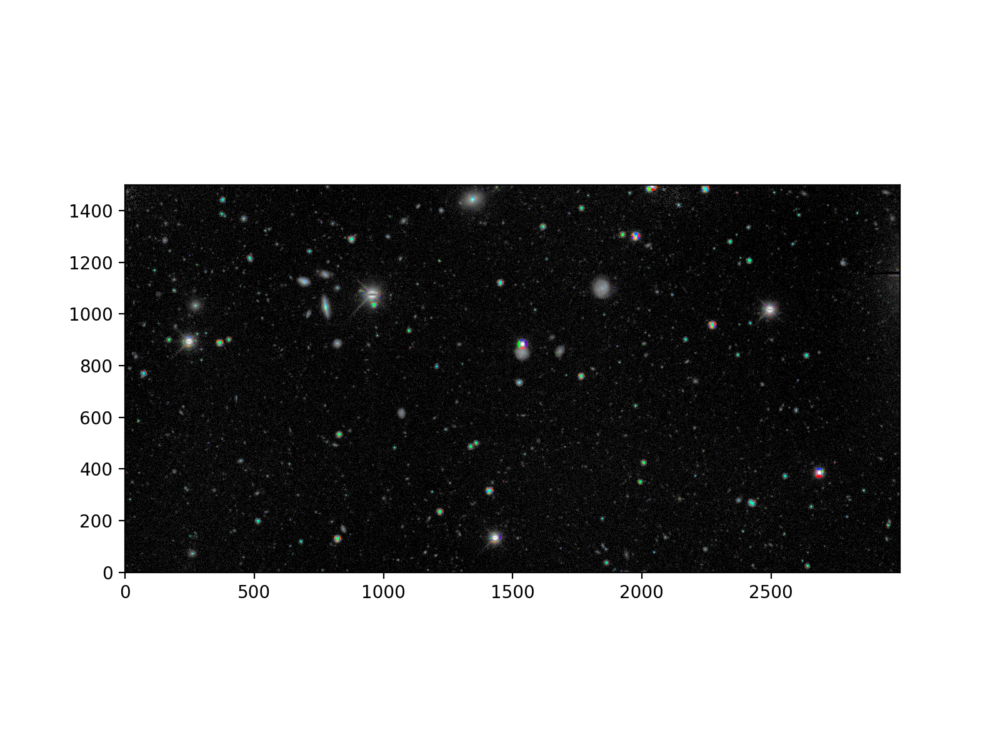

In [26]:
plt.figure(figsize=(8, 6))
ax = plt.subplot(1,1,1)

x0 = 1200
y0 = 700
x_width = 3000
y_width = x_width//2

img_use = dcr_rgb_image[y0:y0 + y_width, x0:x0 + x_width]
plt.imshow(img_use, interpolation='none', origin='lower')
ax.set_autoscale_on(False)
for x, y, r in zip(patch_catalog.x, patch_catalog.y, patch_catalog.redshift):
    x1 = x - x0
    y1 = y - y0
    print(x1, y1, r)
    ax.scatter(x1,y1, s=300, edgecolor='white', facecolor='none')
plt.show()

It's difficult to tell much from looking at the color image, but the quasars do appear to be more blue than the rest of the bright stars. One interesting point of comparison is that the non-quasar bright stars look green in this image, but in the color image of a direct warp DCR coadd those stars look blue. This suggests that there is a systematic position offset between the two, similar to how DCR-induced astrometric calibration errors show up as a shift in the spectral slope of detected objects.

# Load the ap_pipe runs

In [27]:
dbName = 'association.db'
# rerunNameCw = 'cw'
rerunNameDcr = 'dcr_goodSeeing'
rerunNameCw_good = 'cw_goodSeeing'
rerunNameDcr_psf = 'dcr_true5sigma' # but in feb_2020 directory
rerunNameCw_psf = 'cw' # also in feb_2020 directory
rerunNameDcr_psf20s = 'dcr_20sigma' # but in feb_2020 directory
rerunNameCw_psf20s = 'cw_20sigma' # also in feb_2020 directory

Set up the butlers for each run

In [28]:
# CompareWarp rerun, 2014 template and 2015 science
# The 2014 template used a maximum seeing of 1.67"
repoCw15 = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameCw_good
butlerCw15 = dafPersist.Butler(repoCw15)
dbPathCw15 = os.path.join(repoCw15, dbName)

In [29]:
# DCR rerun, 2014 template and 2015 science
# The 2014 DCR model used a maximum seeing of 1.67"
repoDcr15 = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameDcr
butlerDcr15 = dafPersist.Butler(repoDcr15)
dbPathDcr15 = os.path.join(repoDcr15, dbName)

In [30]:
# DCR rerun, 2014 template and 2015 science
# The 2014 DCR model used a maximum seeing of 1.5" and used all PSF-matched warps
# This run of ap_pipe corrected the detection threshold to 5.33 sigma, to account for low variance plane of the DcrModel (this is a bug)
repoDcr15_psf = '/project/sullivan/feb_2020/hits2015/ap_pipe/' + rerunNameDcr_psf
butlerDcr15_psf = dafPersist.Butler(repoDcr15_psf)
dbPathDcr15_psf = os.path.join(repoDcr15_psf, dbName)

In [31]:
# CompareWarp rerun, 2014 template and 2015 science
# The 2014 template used a maximum seeing of 1.5" and used all PSF-matched warps
repoCw15_psf = '/project/sullivan/feb_2020/hits2015/ap_pipe/' + rerunNameCw_psf
butlerCw15_psf = dafPersist.Butler(repoCw15_psf)
dbPathCw15_psf = os.path.join(repoCw15_psf, dbName)

In [32]:
# DCR rerun, 2014 template and 2015 science
# The 2014 DCR model used a maximum seeing of 1.5" and used all PSF-matched warps
# This run of ap_pipe used a detection threshold of 20 sigma (corrected to 21.32) to eliminate other sources of false detections
repoDcr15_psf20s = '/project/sullivan/feb_2020/hits2015/ap_pipe/' + rerunNameDcr_psf20s
butlerDcr15_psf20s = dafPersist.Butler(repoDcr15_psf20s)
dbPathDcr15_psf20s = os.path.join(repoDcr15_psf20s, dbName)

In [33]:
# CompareWarp rerun, 2014 template and 2015 science
# The 2014 template model used a maximum seeing of 1.5" and used all PSF-matched warps
# This run of ap_pipe used a detection threshold of 20 sigma to eliminate other sources of false detections
repoCw15_psf20s = '/project/sullivan/feb_2020/hits2015/ap_pipe/' + rerunNameCw_psf20s
butlerCw15_psf20s = dafPersist.Butler(repoCw15_psf20s)
dbPathCw15_psf20s = os.path.join(repoCw15_psf20s, dbName)

Load the difference imaging sources and objects from the Alert Production Database (APDB)

In [34]:
objTableCw15 = loadAllApdbObjects(repoCw15, dbName)
objTableDcr15 = loadAllApdbObjects(repoDcr15, dbName)

In [35]:
objTableCw15_psf = loadAllApdbObjects(repoCw15_psf, dbName)
objTableDcr15_psf = loadAllApdbObjects(repoDcr15_psf, dbName)

In [36]:
srcTableCw15 = loadAllApdbSources(repoCw15, dbName)
srcTableDcr15 = loadAllApdbSources(repoDcr15, dbName)

In [37]:
srcTableCw15_psf = loadAllApdbSources(repoCw15_psf, dbName)
srcTableDcr15_psf = loadAllApdbSources(repoDcr15_psf, dbName)

In [38]:
objTableCw15_psf20s = loadAllApdbObjects(repoCw15_psf20s, dbName)
srcTableCw15_psf20s = loadAllApdbSources(repoCw15_psf20s, dbName)

In [39]:
objTableDcr15_psf20s = loadAllApdbObjects(repoDcr15_psf20s, dbName)
srcTableDcr15_psf20s = loadAllApdbSources(repoDcr15_psf20s, dbName)

### Filter out the sources that are flagged

In [40]:
badFlagList = ['base_PixelFlags_flag_bad',
               'base_PixelFlags_flag_suspect',
               'base_PixelFlags_flag_saturatedCenter']

In [41]:
def makeSrcTableFlags(srcTbl, objTbl, badFlagList=badFlagList):
    config = MapDiaSourceConfig()
    unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(srcTbl['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=srcTbl.index)
    srcTableFlags = pd.merge(srcTbl, flagTable, left_index=True, right_index=True)
    badFlags = [srcTableFlags[flag] for flag in badFlagList]
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter
    goodSrc = srcTableFlags.loc[noFlagFilter]
    goodObjIds = set(srcTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObj = objTbl.loc[objTbl['diaObjectId'].isin(goodObjIds)]
    return flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, goodSrc, goodObj

In [42]:
def loadTables(repo, dbName='association.db'):
    butler = dafPersist.Butler(repo)
    dbPath = os.path.join(repo, dbName)
    objTable = loadAllApdbObjects(repo, dbName)
    srcTable = loadAllApdbSources(repo, dbName)
    flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, \
    goodSrc, goodObj = makeSrcTableFlags(srcTable, objTable)
    return objTable, srcTable, goodObj, goodSrc

In [43]:
objTableCw15, srcTableCw15, goodObjCw15, goodSrcCw15 = loadTables(repoCw15)
objTableDcr15, srcTableDcr15, goodObjDcr15, goodSrcDcr15 = loadTables(repoDcr15)

/opt/lsst/software/stack/stack/miniconda3-4.7.12-984c9f7/Linux64/ap_association/19.0.0-14-g7adedf7+13/python/lsst/ap/association/mapApData.py:388: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  table_list = list(yaml.load_all(yaml_stream))


In [44]:
objTableCw15b, srcTableCw15b, goodObjCw15b, goodSrcCw15b = loadTables(repoCw15_psf)
objTableDcr15b, srcTableDcr15b, goodObjDcr15b, goodSrcDcr15b = loadTables(repoDcr15_psf)

In [45]:
objTableCw15c, srcTableCw15c, goodObjCw15c, goodSrcCw15c = loadTables(repoCw15_psf20s)
objTableDcr15c, srcTableDcr15c, goodObjDcr15c, goodSrcDcr15c = loadTables(repoDcr15_psf20s)

### Visualize the good DIA objects in the 2015 science images, using 2014 CW templates

In [46]:
def plotHitsSourcesOnSky(srcTable, title=None):
    fig = plt.figure(figsize=(10, 8))
    ax1 = plt.subplot2grid((100, 100), (0, 55), rowspan=50, colspan=45)  # 1 single HiTS field, on the right
    ax2 = plt.subplot2grid((100, 100), (0, 0), rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left
    ax1Filter = (srcTable['decl'] > -2)
    ax2Filter = (~ax1Filter)
    scatter1 = ax1.scatter(srcTable.loc[ax1Filter, 'ra'],
                           srcTable.loc[ax1Filter, 'decl'], 
                           c='C0', s=2, alpha=0.2)
    scatter2 = ax2.scatter(srcTable.loc[ax2Filter, 'ra'], 
                           srcTable.loc[ax2Filter, 'decl'], 
                           c='C0', s=2, alpha=0.2)
    ax1.set_xlabel('RA (deg)')
    ax2.set_xlabel('RA (deg)')
    ax1.set_ylabel('Dec (deg)')
    ax2.set_ylabel('Dec (deg)')
    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax1.invert_xaxis()
    ax2.invert_xaxis()
    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')
    plt.subplots_adjust(wspace=0.1, hspace=0)
    if title is not None:
        plt.title(title)

<IPython.core.display.Javascript object>


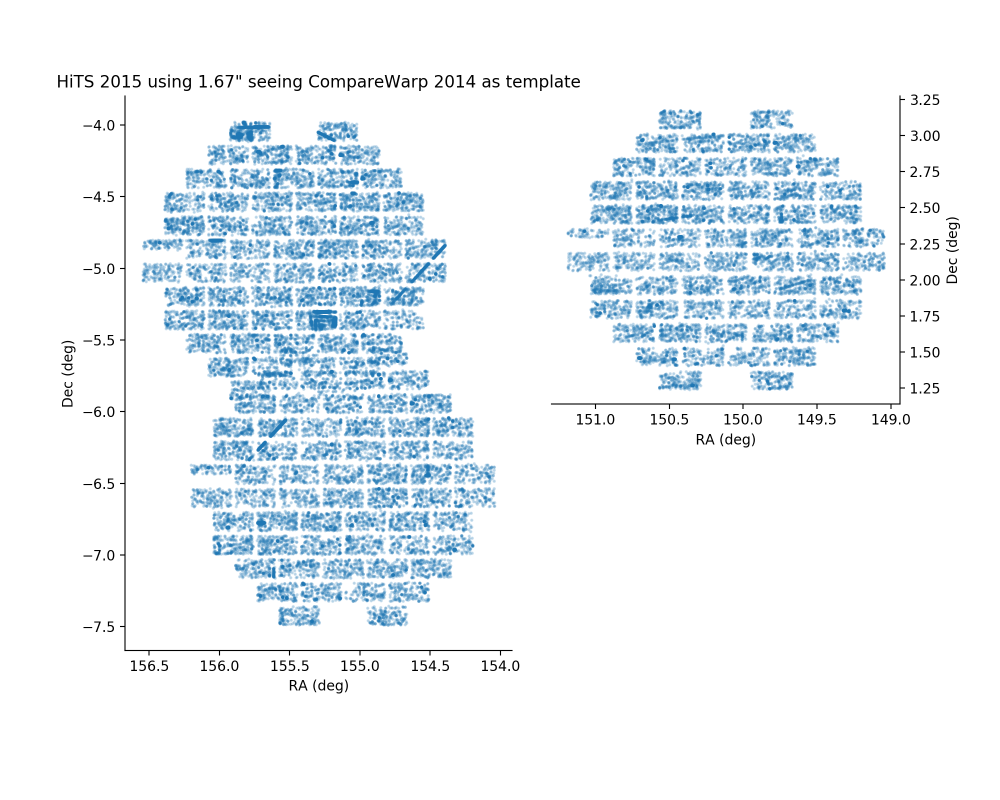

In [47]:
fig1 = plotHitsSourcesOnSky(goodObjCw15, title="HiTS 2015 using 1.67\" seeing CompareWarp 2014 as template")

<IPython.core.display.Javascript object>


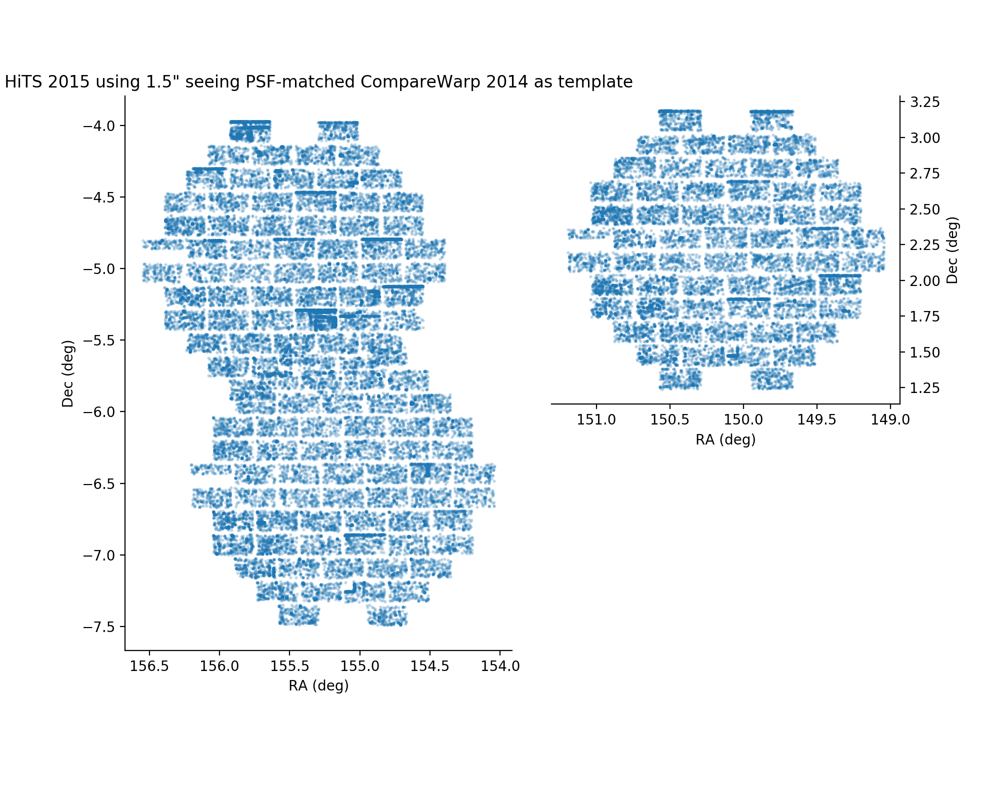

In [48]:
fig1 = plotHitsSourcesOnSky(goodObjCw15b, title="HiTS 2015 using 1.5\" seeing PSF-matched CompareWarp 2014 as template")

### CompareWarp direct vs PSF-matched warps
There are two major differences visible: 

The diagonal streak running through the two fields on the left disappears with PSF-matched warps, or perhaps with the slightly more restrictive seeing selection. This diagonal streak is odd, because it can't be from the sky since the two fields are observed at different times.

The second major difference is the excess of bad sources at the edges of CCDs that are not being rejected in the PSF-matched version.

### Visualize the good DIA objects in the 2015 science images, using 2014 DCR templates

<IPython.core.display.Javascript object>


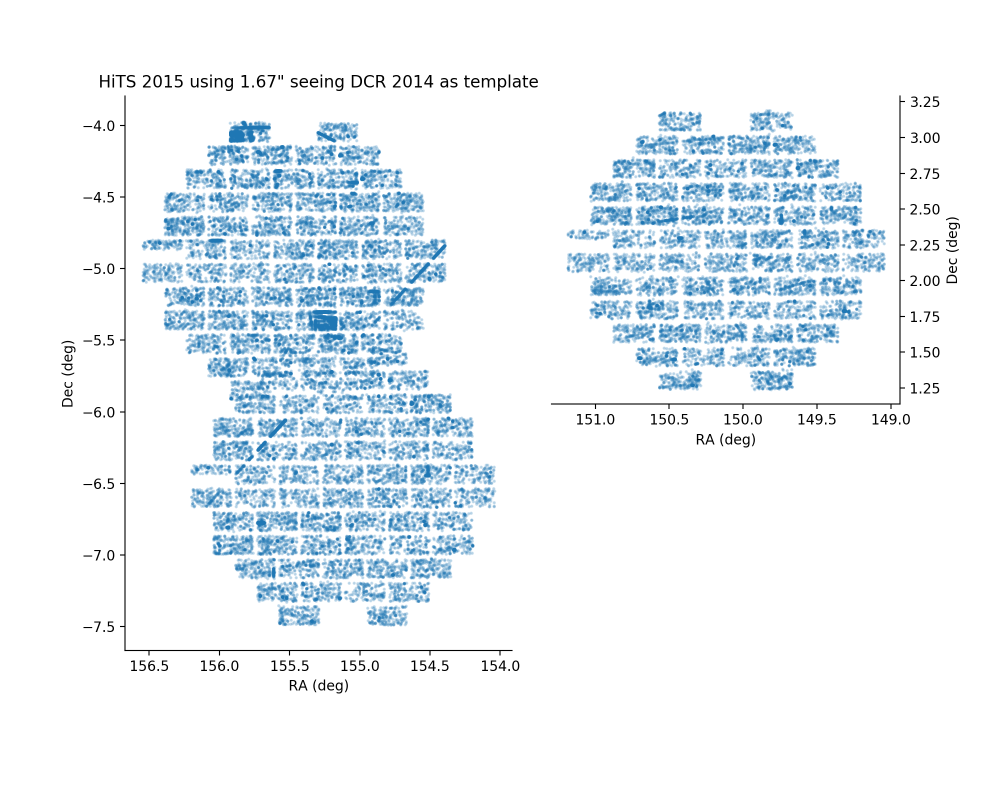

In [49]:
fig1 = plotHitsSourcesOnSky(goodObjDcr15, title="HiTS 2015 using 1.67\" seeing DCR 2014 as template")

<IPython.core.display.Javascript object>


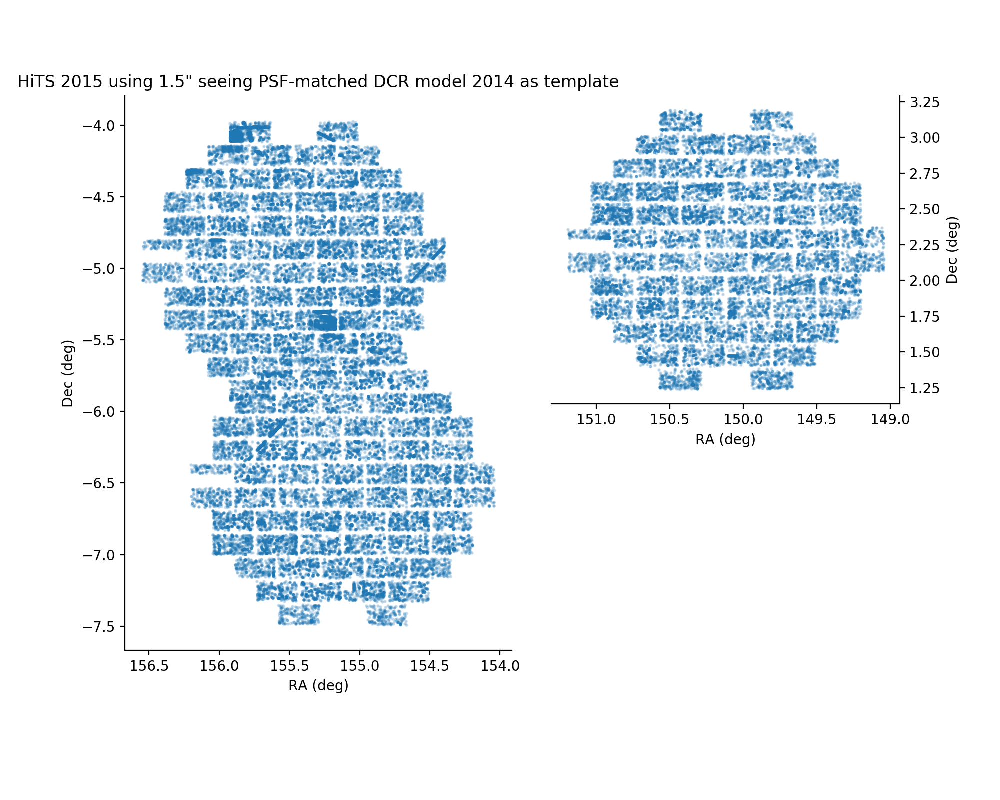

In [50]:
fig1 = plotHitsSourcesOnSky(goodObjDcr15b, title="HiTS 2015 using 1.5\" seeing PSF-matched DCR model 2014 as template")

### DCR direct vs PSF-matched warps

The distributions of "good" sources using the DCR templates are similar to those using CompareWarp templates, except for the two major differences described above. The strange diagonal streak across the two feilds on the left is clearly still present using PSF-matched warps, suggesting that the disappearance from the CompareWarp PSF-matched source distribution was due to the different warping, and not the more restrictive seeing selection.

On the other hand, the excess of sources at CCD edges seen in the CompareWarp PSF-matched plot is not present in the DCR version.

These mixed results suggest that we should use a higher detection threshold for this comparison, in order to weed out artifacts from other parts of the image differencing pipeline.

## Now look at a smaller zoomed-in region, and compare 5 vs 20 sigma detection threshold

In [51]:
def plotZoomedRegion(objTable, srcTable, title=''):
    fig = plt.figure(figsize=(9,6))
    plt.scatter(srcTable['ra'], 
                srcTable['decl'], 
                color='C1', s=5, alpha=0.3)
    plt.scatter(objTable.loc[(objTable['nDiaSources'] >= 20), 'ra'], 
                objTable.loc[(objTable['nDiaSources'] >= 20), 'decl'], 
                color='C0', s=15, alpha=0.3)
    plt.xlabel('RA (deg)')
    plt.ylabel('Dec (deg)')
    plt.gca().set_xlim(155.3, 154.8)
    plt.gca().set_ylim(-6.02, -5.60)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


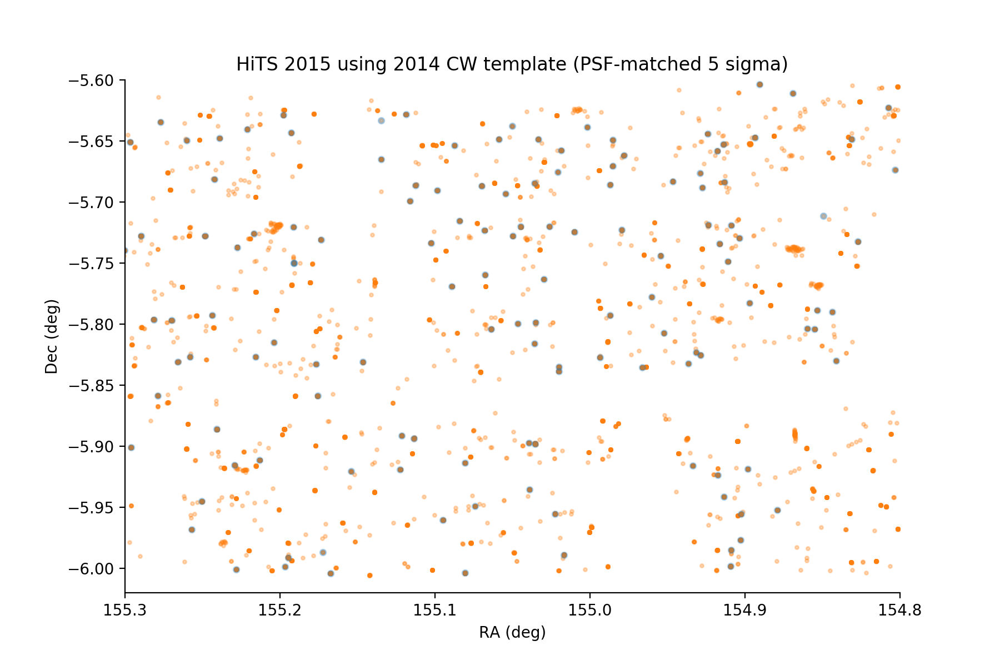

<IPython.core.display.Javascript object>


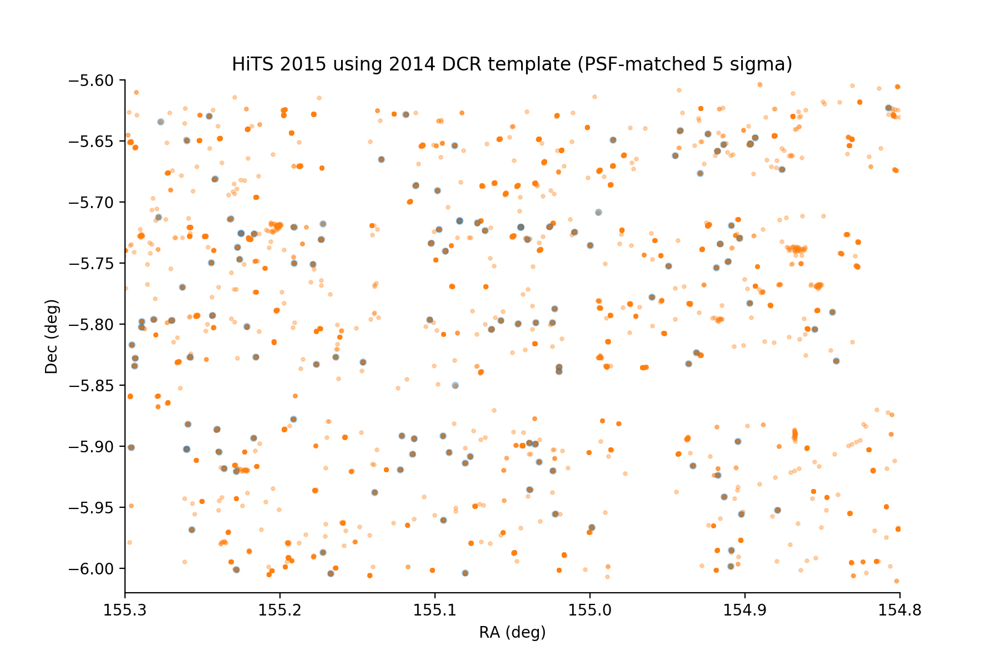

<IPython.core.display.Javascript object>


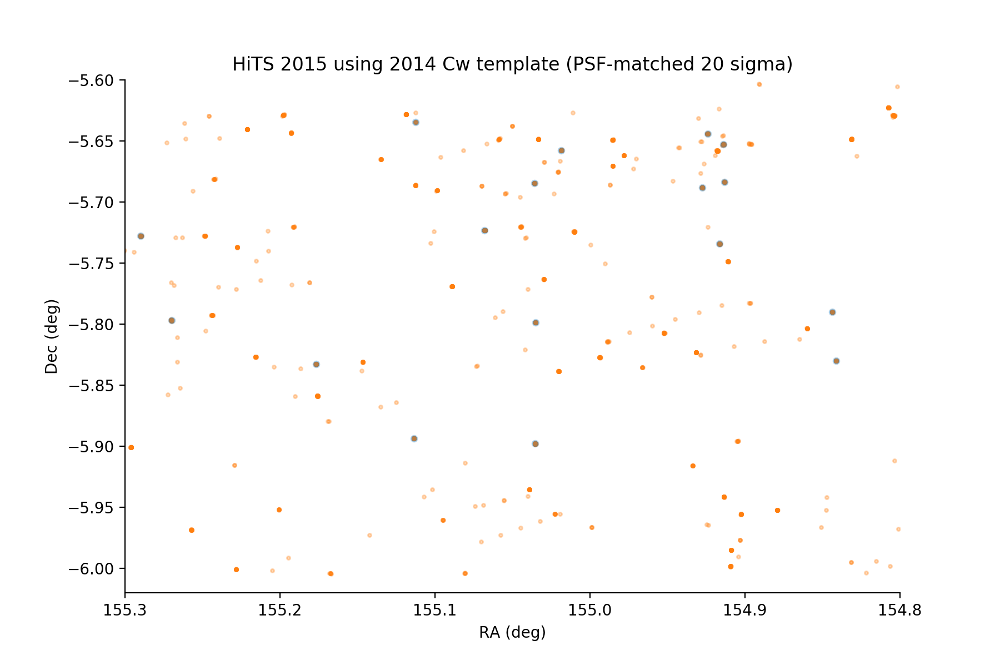

<IPython.core.display.Javascript object>


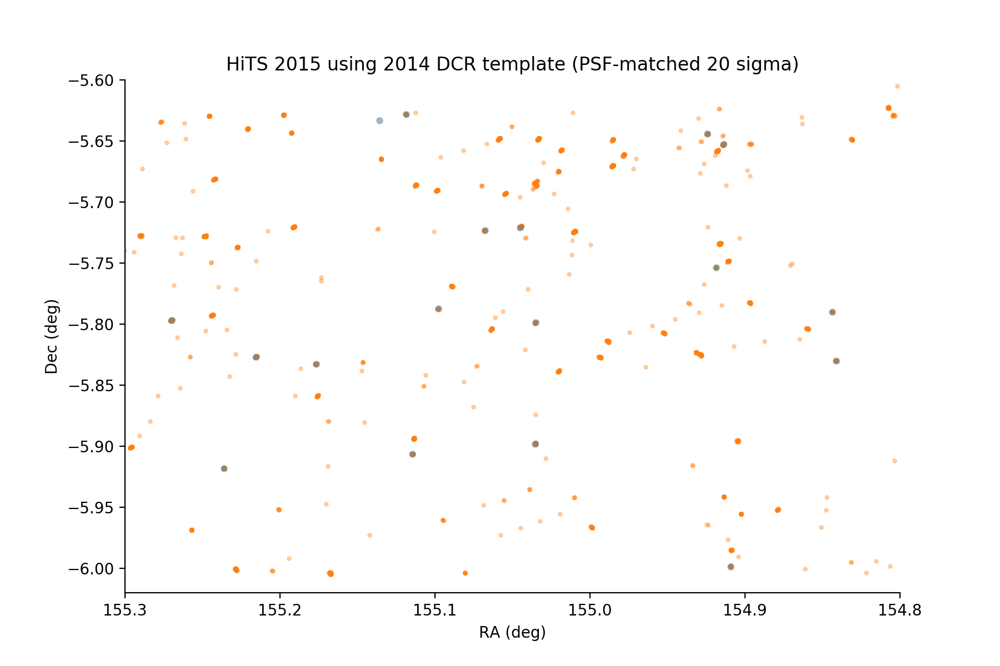

In [52]:
plotZoomedRegion(goodObjCw15b, goodSrcCw15b, title='HiTS 2015 using 2014 CW template (PSF-matched 5 sigma)')
plotZoomedRegion(goodObjDcr15b, goodSrcDcr15b, title='HiTS 2015 using 2014 DCR template (PSF-matched 5 sigma)')
plotZoomedRegion(goodObjCw15c, goodSrcCw15c, title='HiTS 2015 using 2014 Cw template (PSF-matched 20 sigma)')
plotZoomedRegion(goodObjDcr15c, goodSrcDcr15c, title='HiTS 2015 using 2014 DCR template (PSF-matched 20 sigma)')

## All DIA Objects using standard 5 sigma detection threshold
Plot the number of DIA objects using the 2014 coadds as templates. Note that there are 28 observations of each field in 2015, but there is a small region of overlap between two pointings so we get a small number of objects detected more than 28 times.

<IPython.core.display.Javascript object>


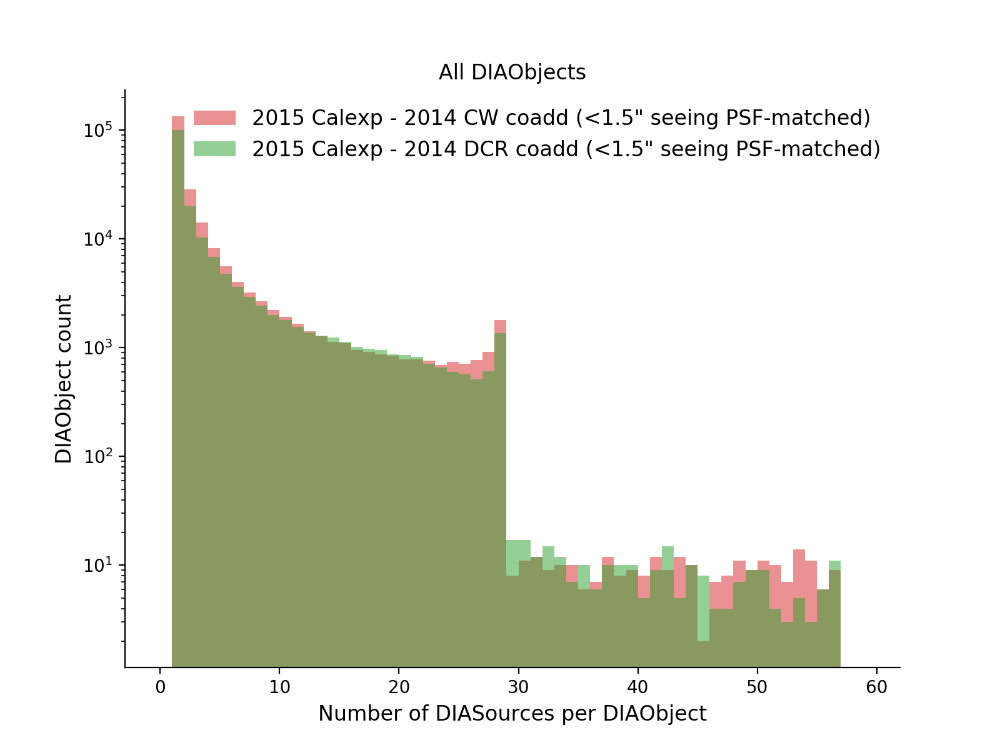

Text(0.5, 1.0, 'All DIAObjects')

In [53]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
#plt.ylim(0.7, 1e5)
plt.yscale('log')

plt.hist(objTableCw15_psf['nDiaSources'].values, bins=np.arange(0, 60), color='C3', alpha=0.5, label='2015 Calexp - 2014 CW coadd (<1.5" seeing PSF-matched)')
plt.hist(objTableDcr15_psf['nDiaSources'].values, bins=np.arange(0, 60), color='C2', alpha=0.5, label='2015 Calexp - 2014 DCR coadd (<1.5" seeing PSF-matched)')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('All DIAObjects')

With the standard 5 sigma detection threshold it looks as though the DCR coadds are performing slightly better than the standard CompareWarp deep coadds. It is certainly not the 50-80% reduction seen in simulations, however.

## All DIA Objects using increased 20 sigma detection threshold
The templates created using PSF-matched warps have a larger PSF than the templates created using direct warps. The current image differencing pipeline has difficulty when the science image has a smaller PSF than the template, with the deconvolution generating many artifacts. One idea to work around this is to increase the detection threshold and only compare higher quality objects.


<IPython.core.display.Javascript object>


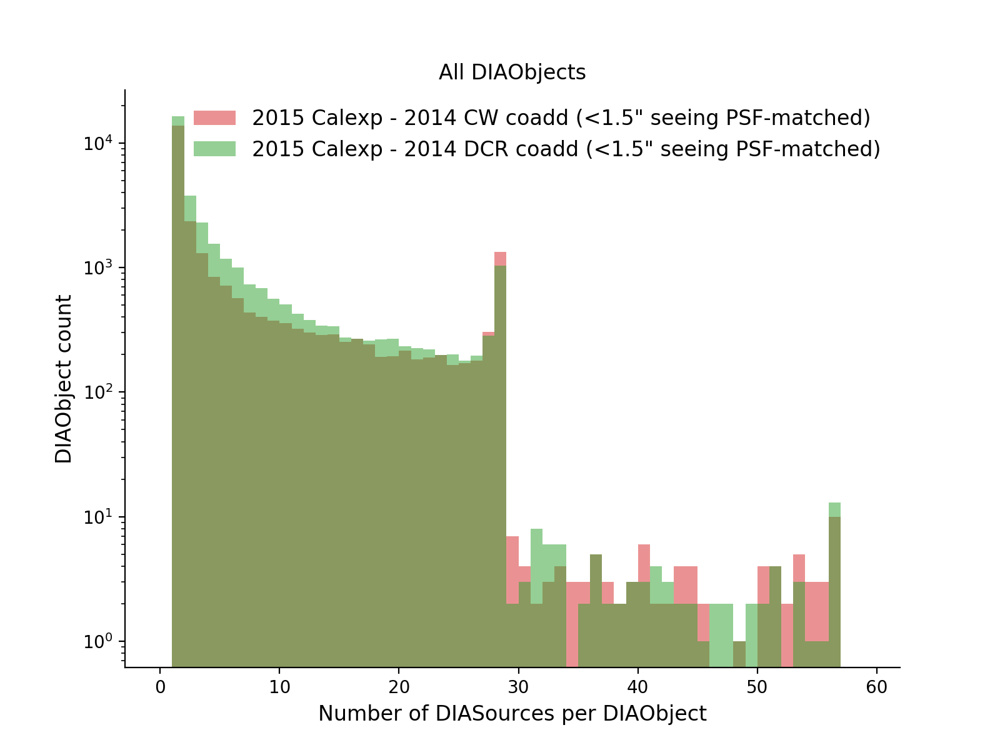

Text(0.5, 1.0, 'All DIAObjects')

In [54]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)

plt.yscale('log')

plt.hist(objTableCw15_psf20s['nDiaSources'].values, bins=np.arange(0, 60), color='C3', alpha=0.5, label='2015 Calexp - 2014 CW coadd (<1.5" seeing PSF-matched)')
plt.hist(objTableDcr15_psf20s['nDiaSources'].values, bins=np.arange(0, 60), color='C2', alpha=0.5, label='2015 Calexp - 2014 DCR coadd (<1.5" seeing PSF-matched)')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('All DIAObjects')

While the number of detected objects was greatly reduced by increasing the detection threshold from 5 to 20 sigma, we see that the DCR templates have significantly more of these high 

### Now plot the histograms of just the good (not flagged) objects in each run

<IPython.core.display.Javascript object>


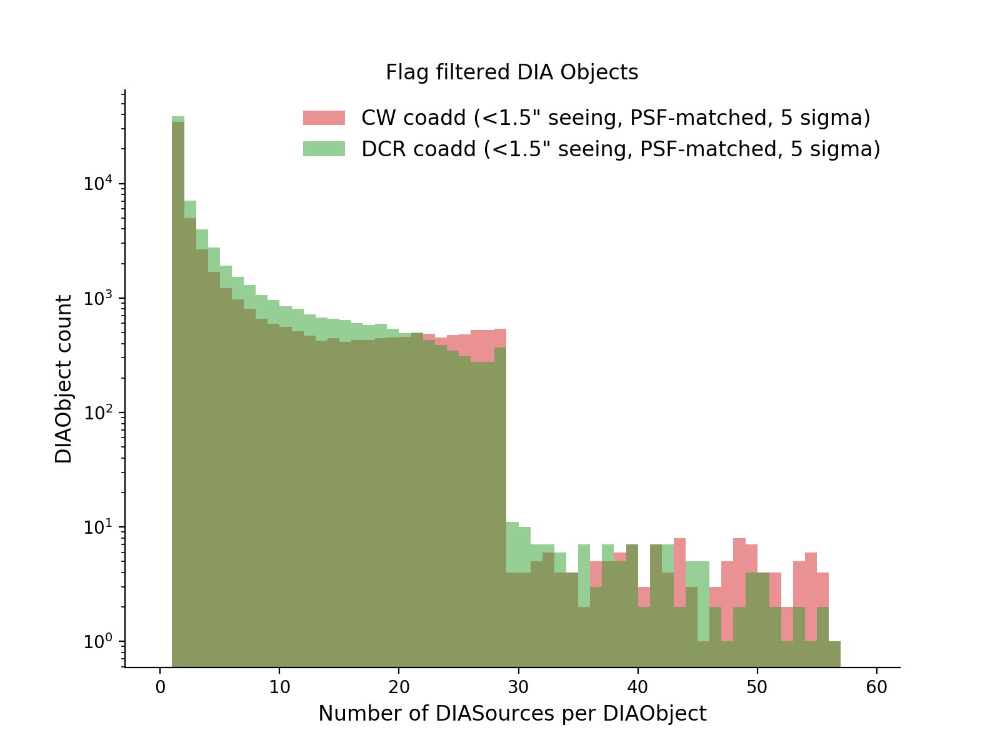

Text(0.5, 1.0, 'Flag filtered DIA Objects')

In [55]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')

plt.hist(goodObjCw15b['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C3', alpha=0.5, label='CW coadd (<1.5" seeing, PSF-matched, 5 sigma)')
plt.hist(goodObjDcr15b['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='DCR coadd (<1.5" seeing, PSF-matched, 5 sigma)')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flag filtered DIA Objects')

<IPython.core.display.Javascript object>


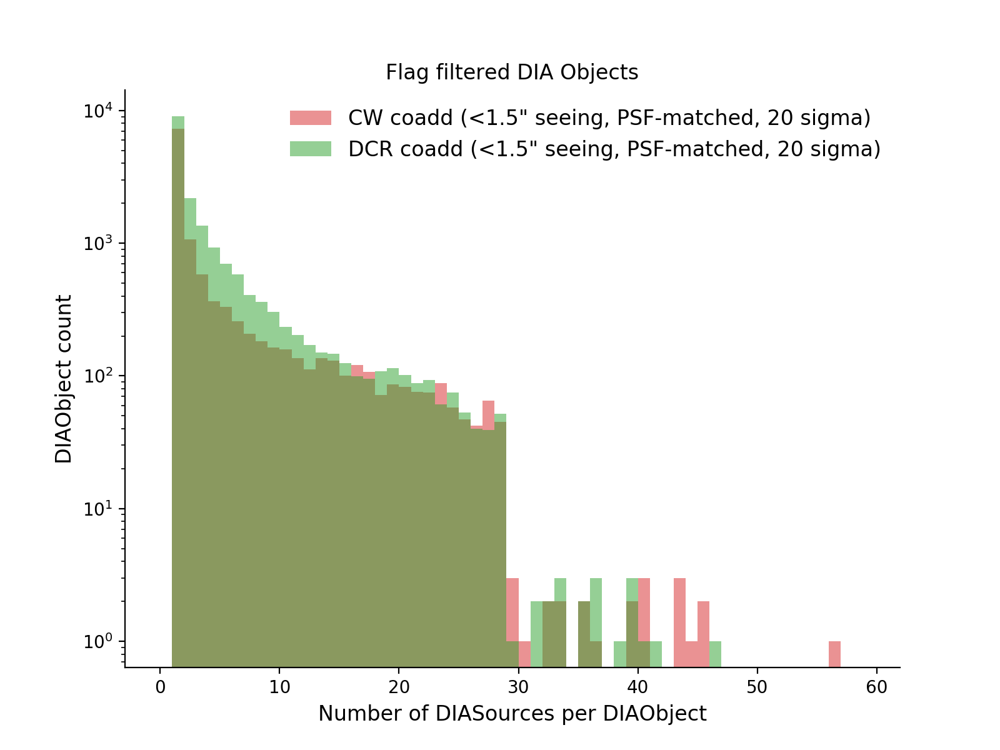

Text(0.5, 1.0, 'Flag filtered DIA Objects')

In [56]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')

plt.hist(goodObjCw15c['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C3', alpha=0.5, label='CW coadd (<1.5" seeing, PSF-matched, 20 sigma)')
plt.hist(goodObjDcr15c['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='DCR coadd (<1.5" seeing, PSF-matched, 20 sigma)')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flag filtered DIA Objects')

## Raw DIASource Counts

In [57]:
allTable = astropy.table.Table([["Direct", "PSF-matched", "PSF-matched 20 sigma"],
                                [len(srcTableCw15), len(srcTableCw15b), len(srcTableCw15c)],
                                [len(srcTableDcr15), len(srcTableDcr15b), len(srcTableDcr15c)]],
                                names=["Style", "CW 2015", "DCR 2015"])
goodTable = astropy.table.Table([["Direct", "PSF-matched", "PSF-matched 20 sigma"],
                                 [len(goodSrcCw15), len(goodSrcCw15b), len(goodSrcCw15c)],
                                 [len(goodSrcDcr15), len(goodSrcDcr15b), len(goodSrcDcr15c)]],
                                 names=["Style", "CW 2015", "DCR 2015"])

In [58]:
# Total number of DIA sources in each rerun
print(allTable)

       Style         CW 2015 DCR 2015
-------------------- ------- --------
              Direct  444545   451155
         PSF-matched  756891   644656
PSF-matched 20 sigma  159715   184175


In [59]:
# Total number of flag-filtered DIA sources in each rerun
print(goodTable)

       Style         CW 2015 DCR 2015
-------------------- ------- --------
              Direct  209799   211766
         PSF-matched  236773   278564
PSF-matched 20 sigma   47894    67352


# Conclusion
### These results are mixed.
The current coadded template generation and image differencing pipeline results in considerably more false detections using PSF-matched warps than direct warps. This increase is present for both standard CompareWarp and DCR templates, though most of the excess false detections are correctly identified and flagged. 

The total number of difference image analysis (DIA) sources is lower for some styles of DCR templates than the corresponding CompareWarp templates, but is higher for others. As seen in the visualization of the DIA source locations, many of these sources are clearly artifacts which will hopefully be mitigated by other improvements to our pipeline. However, with a conservative comparison of DIA sources, using only 20 sigma or greater detections, the DCR templates actually result in a significant increase in the number of un-flagged sources.

The color image of the DCR coadd gives an indication that the DCR model is capturing the color of objects, since the known quasars appear to have a bluer color than the stars. This color difference will be quantified in DM-21306. Assuming that the model is picking up the real colors, there are a few possibilities for why the DCR template is not reducing the number of detections:
* There could be an error in the metadata, causing DCR to be calculated differently between 2014 and 2015. There have been errors in the metadata in the past, and some elements are used only for the DCR calculation, so this is possible. However, in a previous test I have used the 2014 data as the template for 2014 science images, and there was not a substantial improvement. That test was performed before other recent bug fixes, so it is possible, though unlikely, that repeating it now would obtain better results.
* We know DCR introduces astrometric calibration errors, but we don't know what effect correcting for DCR in the template has on those errors. It is possible that the astrometric errors from DCR cancel out for most sources when using the standard deep coadds, but do not cancel out with the DCR coadds. This would be improved and possibly fixed by using Jointcal for calibration.
* The PSF of the DCR template is slightly incorrect, and using it for PSF matching might lead to errors. This is not as bad of a problem as it may sound, because the PSF of the template is only used to compute parameters to set up the matching kernel, and the actual kernel is measured from isolated sources in the images. This could be improved by modifying the PSF of the DCR coadd as it used to make a matched template for the science image.
* The DCR coadd can still be improved. The PSF-matched warps that were used to construct the DCR coadd in this analysis included DCR in the PSFs that were being matched. That will have incorrectly elongated the PSFs of low airmass observations with good seeing, which would prevent the model from converging on the correct solution. The fix would be to create a new type of intermediate data product of "DCRmatched" warps, where the PSF of each observation is deconvolved with the average elongation due to DCR before matching.